In [2]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.pipeline import Pipeline

In [3]:
df = pd.read_csv("All_Battery.csv")
df.shape

(114738, 13)

In [4]:
df

,IR,QC,QD,Tavg,Tmin,Tmax,chargetime,cycle,battery_id,cycle_life,C1,Q1,C2
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,b1c0,1190.0,3.6,80.0,3.6
1,0.016742,1.071042,1.070689,31.875011,29.566130,35.652016,13.341250,2.0,b1c0,1190.0,3.6,80.0,3.6
2,0.016724,1.071674,1.071900,31.931490,29.604385,35.692978,13.425777,3.0,b1c0,1190.0,3.6,80.0,3.6
3,0.016681,1.072304,1.072510,31.932603,29.744202,35.680588,13.425167,4.0,b1c0,1190.0,3.6,80.0,3.6
4,0.016662,1.072970,1.073174,31.959322,29.644709,35.728691,13.341442,5.0,b1c0,1190.0,3.6,80.0,3.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114733,0.017538,0.881796,0.881539,32.532753,30.328932,34.571934,15.404138,1796.0,b3c45,1801.0,4.8,80.0,4.8
114734,0.017294,0.881874,0.881441,32.679857,29.591684,35.492989,15.497987,1797.0,b3c45,1801.0,4.8,80.0,4.8
114735,0.017605,0.881364,0.880883,32.217071,31.470758,33.999550,16.357937,1798.0,b3c45,1801.0,4.8,80.0,4.8
114736,0.017526,0.881120,0.880757,33.035630,29.526152,35.779078,16.046140,1799.0,b3c45,1801.0,4.8,80.0,4.8


In [5]:
df.describe()

,IR,QC,QD,Tavg,Tmin,Tmax,chargetime,cycle,cycle_life,C1,Q1,C2
count,114738.000000,114738.000000,114738.000000,114738.000000,114738.000000,114738.000000,114738.000000,114738.000000,110312.000000,110854.000000,110854.000000,110854.000000
mean,0.016538,1.031696,1.031557,34.236890,31.337117,37.921526,11.145815,486.221391,917.014658,5.292848,49.884776,4.164134
std,0.001348,0.055286,0.054813,2.058610,1.660521,2.606819,6.162787,372.120196,356.343171,0.987481,22.948593,0.729248
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,148.000000,1.000000,2.000000,3.000000
25%,0.015524,1.014865,1.014826,32.951778,30.147556,36.352752,10.064360,206.000000,663.000000,4.800000,31.000000,3.600000
50%,0.016460,1.048349,1.048514,34.050259,31.187714,38.158327,10.638028,414.500000,876.000000,5.300000,50.000000,4.000000
75%,0.017283,1.067116,1.067374,35.602587,32.480482,39.763619,11.291779,682.000000,1078.000000,5.600000,69.000000,4.800000
max,0.024405,2.965895,2.884085,41.440286,36.691219,44.662853,1290.370762,2237.000000,1935.000000,8.000000,80.000000,6.000000


In [6]:
df.describe(include='all')

,IR,QC,QD,Tavg,Tmin,Tmax,chargetime,cycle,battery_id,cycle_life,C1,Q1,C2
count,114738.000000,114738.000000,114738.000000,114738.000000,114738.000000,114738.000000,114738.000000,114738.000000,114738,110312.000000,110854.000000,110854.000000,110854.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,140,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b3c32,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2237,NaN,NaN,NaN,NaN
mean,0.016538,1.031696,1.031557,34.236890,31.337117,37.921526,11.145815,486.221391,NaN,917.014658,5.292848,49.884776,4.164134
std,0.001348,0.055286,0.054813,2.058610,1.660521,2.606819,6.162787,372.120196,NaN,356.343171,0.987481,22.948593,0.729248
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,NaN,148.000000,1.000000,2.000000,3.000000
25%,0.015524,1.014865,1.014826,32.951778,30.147556,36.352752,10.064360,206.000000,NaN,663.000000,4.800000,31.000000,3.600000
50%,0.016460,1.048349,1.048514,34.050259,31.187714,38.158327,10.638028,414.500000,NaN,876.000000,5.300000,50.000000,4.000000
75%,0.017283,1.067116,1.067374,35.602587,32.480482,39.763619,11.291779,682.000000,NaN,1078.000000,5.600000,69.000000,4.800000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114738 entries, 0 to 114737
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   IR          114738 non-null  float64
 1   QC          114738 non-null  float64
 2   QD          114738 non-null  float64
 3   Tavg        114738 non-null  float64
 4   Tmin        114738 non-null  float64
 5   Tmax        114738 non-null  float64
 6   chargetime  114738 non-null  float64
 7   cycle       114738 non-null  float64
 8   battery_id  114738 non-null  object 
 9   cycle_life  110312 non-null  float64
 10  C1          110854 non-null  float64
 11  Q1          110854 non-null  float64
 12  C2          110854 non-null  float64
dtypes: float64(12), object(1)
memory usage: 11.4+ MB


In [8]:
df.isnull().sum()

IR               0
QC               0
QD               0
Tavg             0
Tmin             0
Tmax             0
chargetime       0
cycle            0
battery_id       0
cycle_life    4426
C1            3884
Q1            3884
C2            3884
dtype: int64

In [9]:
df.duplicated().sum()

np.int64(0)

In [10]:
# removes outliers
check_col = ['IR', 'QC', 'QD', 'Tavg', 'Tmin', 'Tmax', 'chargetime']

Q1 = df[check_col].quantile(0.25)
Q3 = df[check_col].quantile(0.75)
IQR = Q3 - Q1

multiplier = 2.5
lower_bound = Q1 - multiplier * IQR
upper_bound = Q3 + multiplier * IQR

mask = ~((df[check_col] < lower_bound) | (df[check_col] > upper_bound)).any(axis=1)
df_clean = df[mask]

In [11]:
print("Original shape:", df.shape)
print("Cleaned shape:", df_clean.shape)

Original shape: (114738, 13)
Cleaned shape: (110678, 13)


In [12]:
# Define columns to impute
cols_to_impute = ['IR', 'QC', 'QD', 'Tavg', 'Tmin', 'Tmax', 'chargetime', 'C1', 'Q1', 'C2', 'cycle_life']

# Create imputer instance
imputer = KNNImputer(n_neighbors=5, weights='uniform')

# Fit and transform only those columns, preserving the rest
df_all_cl_dt = df_clean.copy()
df_all_cl_dt[cols_to_impute] = imputer.fit_transform(df_all_cl_dt[cols_to_impute])


In [13]:
df_all_cl_dt.shape

(110678, 13)

In [14]:
df_clean = df_all_cl_dt.copy()
df_clean.shape

(110678, 13)

In [15]:
df_clean

,IR,QC,QD,Tavg,Tmin,Tmax,chargetime,cycle,battery_id,cycle_life,C1,Q1,C2
1,0.016742,1.071042,1.070689,31.875011,29.566130,35.652016,13.341250,2.0,b1c0,1190.0,3.6,80.0,3.6
2,0.016724,1.071674,1.071900,31.931490,29.604385,35.692978,13.425777,3.0,b1c0,1190.0,3.6,80.0,3.6
3,0.016681,1.072304,1.072510,31.932603,29.744202,35.680588,13.425167,4.0,b1c0,1190.0,3.6,80.0,3.6
4,0.016662,1.072970,1.073174,31.959322,29.644709,35.728691,13.341442,5.0,b1c0,1190.0,3.6,80.0,3.6
5,0.016623,1.073491,1.073576,31.961062,29.752932,35.711758,13.340835,6.0,b1c0,1190.0,3.6,80.0,3.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114723,0.016574,0.886341,0.886051,33.063457,29.724524,35.298668,13.406042,1786.0,b3c45,1801.0,4.8,80.0,4.8
114724,0.017086,0.885619,0.885161,32.179427,31.453802,33.835067,13.934140,1787.0,b3c45,1801.0,4.8,80.0,4.8
114725,0.016800,0.885216,0.884995,32.883015,29.407444,35.795364,13.676095,1788.0,b3c45,1801.0,4.8,80.0,4.8
114726,0.017045,0.884851,0.884395,32.506417,31.585565,34.115726,14.129537,1789.0,b3c45,1801.0,4.8,80.0,4.8


In [16]:
df_clean
df_clean = pd.DataFrame(df_clean)

In [17]:
df_clean

,IR,QC,QD,Tavg,Tmin,Tmax,chargetime,cycle,battery_id,cycle_life,C1,Q1,C2
1,0.016742,1.071042,1.070689,31.875011,29.566130,35.652016,13.341250,2.0,b1c0,1190.0,3.6,80.0,3.6
2,0.016724,1.071674,1.071900,31.931490,29.604385,35.692978,13.425777,3.0,b1c0,1190.0,3.6,80.0,3.6
3,0.016681,1.072304,1.072510,31.932603,29.744202,35.680588,13.425167,4.0,b1c0,1190.0,3.6,80.0,3.6
4,0.016662,1.072970,1.073174,31.959322,29.644709,35.728691,13.341442,5.0,b1c0,1190.0,3.6,80.0,3.6
5,0.016623,1.073491,1.073576,31.961062,29.752932,35.711758,13.340835,6.0,b1c0,1190.0,3.6,80.0,3.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
114723,0.016574,0.886341,0.886051,33.063457,29.724524,35.298668,13.406042,1786.0,b3c45,1801.0,4.8,80.0,4.8
114724,0.017086,0.885619,0.885161,32.179427,31.453802,33.835067,13.934140,1787.0,b3c45,1801.0,4.8,80.0,4.8
114725,0.016800,0.885216,0.884995,32.883015,29.407444,35.795364,13.676095,1788.0,b3c45,1801.0,4.8,80.0,4.8
114726,0.017045,0.884851,0.884395,32.506417,31.585565,34.115726,14.129537,1789.0,b3c45,1801.0,4.8,80.0,4.8


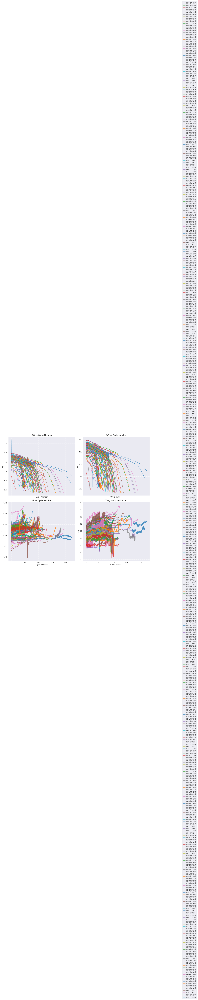

In [18]:
# Set up 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharex=True)

# Define the features and subplot titles
plots = [
    ("QC", "QC vs Cycle Number"),
    ("QD", "QD vs Cycle Number"),
    ("IR", "IR vs Cycle Number"),
    ("Tavg", "Tavg vs Cycle Number")
]

# Loop through each feature and plot
for ax, (col, title) in zip(axes.flat, plots):
    for battery_id, group in df_clean.groupby("battery_id"):
        group = group.sort_values(by="cycle")  # Sort by cycle
        ax.plot(
            group['cycle'],
            group[col],
            label=f"{battery_id} (CL: {group['cycle_life'].iloc[0]:.0f})",
            linewidth=1.2,
            alpha=0.8
        )
    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Cycle Number", fontsize=12)
    ax.set_ylabel(col, fontsize=12)
    ax.grid(True, linestyle="--", alpha=0.6)

# Put legend outside on the right
fig.legend(
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    fontsize="small"
)

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Leave space for legend
plt.show()


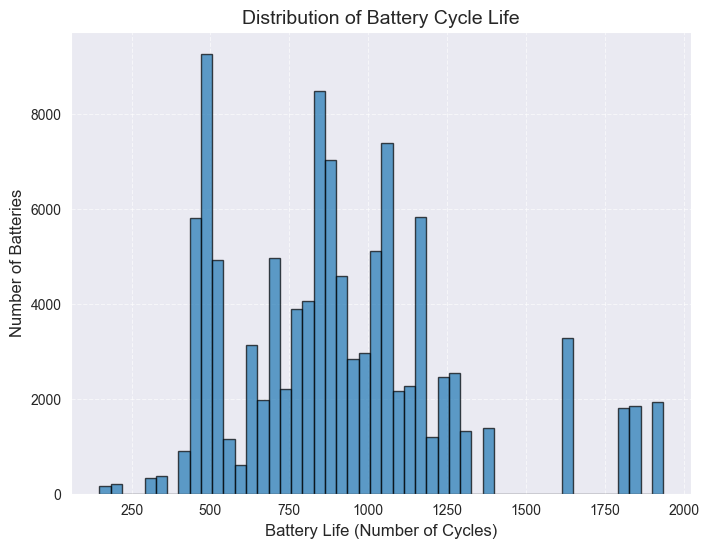

In [19]:
plt.figure(figsize=(8, 6))
plt.hist(df['cycle_life'], bins=50, alpha=0.7, edgecolor='black')
plt.xlabel('Battery Life (Number of Cycles)', fontsize=12)
plt.ylabel('Number of Batteries', fontsize=12)
plt.title('Distribution of Battery Cycle Life', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


In [20]:
# Load dataset
df = pd.read_csv("All_Battery.csv")

# Plot interactive histogram with Plotly
fig = px.histogram(
    df,
    x="cycle_life",
    nbins=50,
    title="Distribution of Battery Cycle Life",
    labels={"cycle_life": "Battery Life (Number of Cycles)", "count": "Number of Batteries"},
    opacity=0.7
)

# Improve layout
fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_layout(
    xaxis=dict(title="Battery Life (Number of Cycles)"),
    yaxis=dict(title="Number of Batteries"),
    bargap=0.1
)

fig.show()


In [21]:
fig = px.histogram(
    df,
    x="battery_id",
    color="battery_id",  # each battery gets a color
    title="Distribution of Battery IDs",
    labels={"battery_id": "Battery ID", "count": "Number of Records"},
    opacity=0.7
)

fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_layout(
    xaxis=dict(title="Battery ID"),
    yaxis=dict(title="Number of Records"),
    bargap=0.1
)

fig.show()


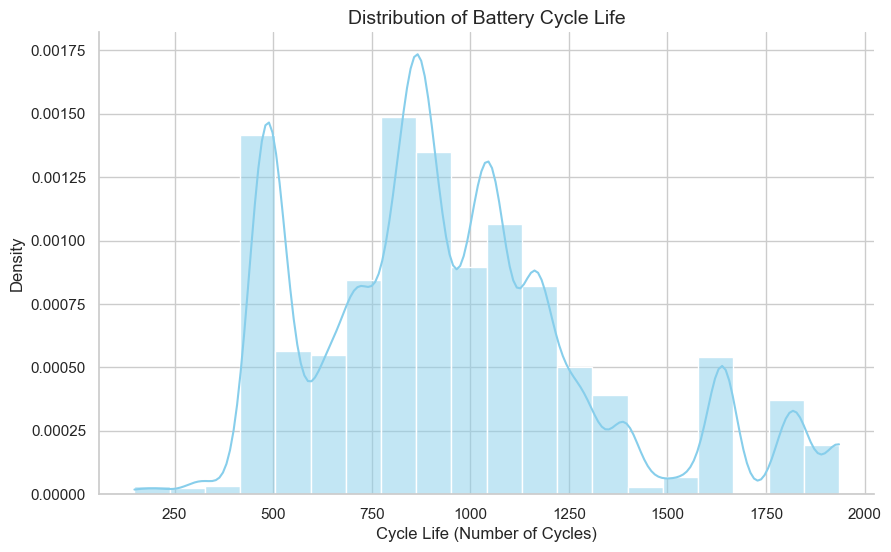

In [22]:
# Set figure size
plt.figure(figsize=(10, 6))

# Apply Seaborn style
sns.set(style="whitegrid")

# Histogram with KDE for cycle_life
sns.histplot(
    df_clean["cycle_life"],  # use cycle_life column
    kde=True,
    color="skyblue",
    stat="density",
    bins=20
)

# Labels and title
plt.title('Distribution of Battery Cycle Life', fontsize=14)
plt.xlabel('Cycle Life (Number of Cycles)', fontsize=12)
plt.ylabel('Density', fontsize=12)

# Remove extra borders
sns.despine()

# Show plot
plt.show()


In [23]:
# Create histogram with KDE
fig = px.histogram(
    df_clean,
    x="cycle_life",
    nbins=20,
    marginal="violin",  # optional, shows density (like KDE)
    title="Distribution of Battery Cycle Life",
    labels={"cycle_life": "Cycle Life (Number of Cycles)"},
    opacity=0.7
)

# Update layout for better styling
fig.update_layout(
    xaxis_title="Cycle Life (Number of Cycles)",
    yaxis_title="Density",
    bargap=0.1
)

# Show interactive plot
fig.show()


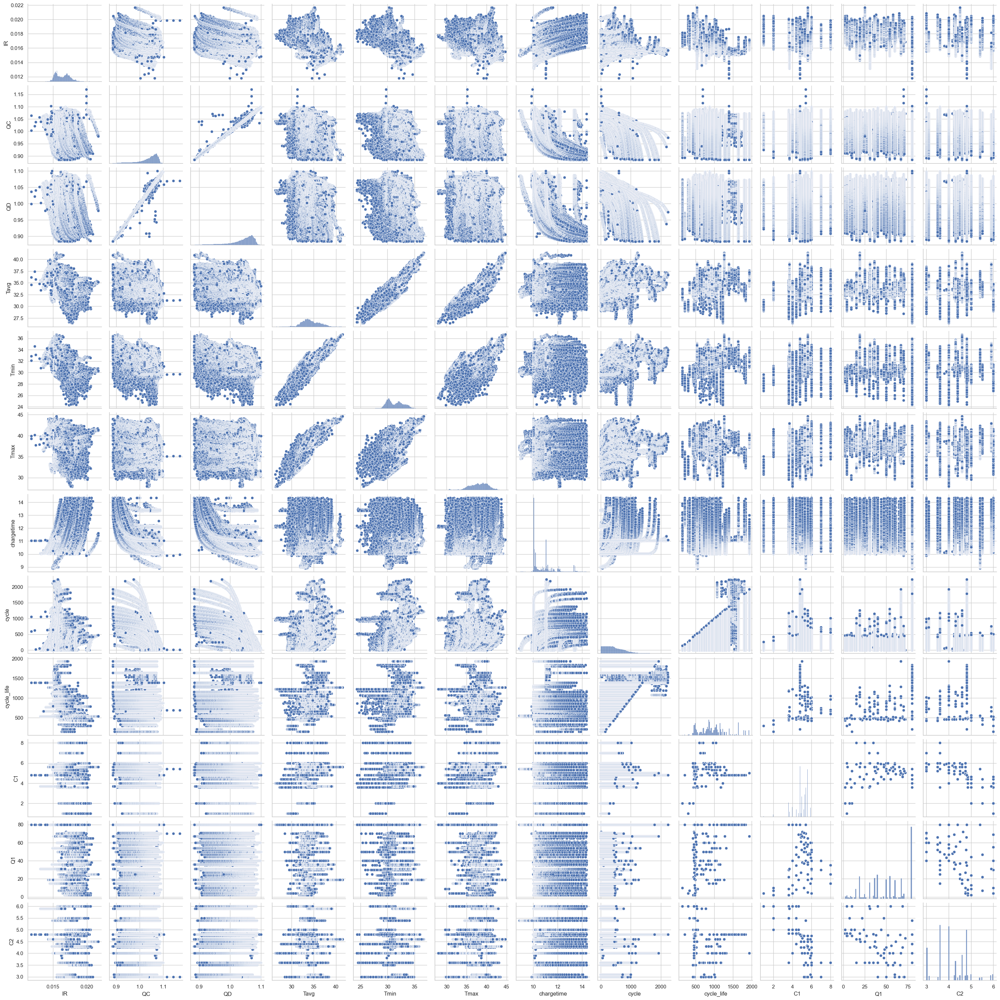

In [24]:
sns.pairplot(df_clean)

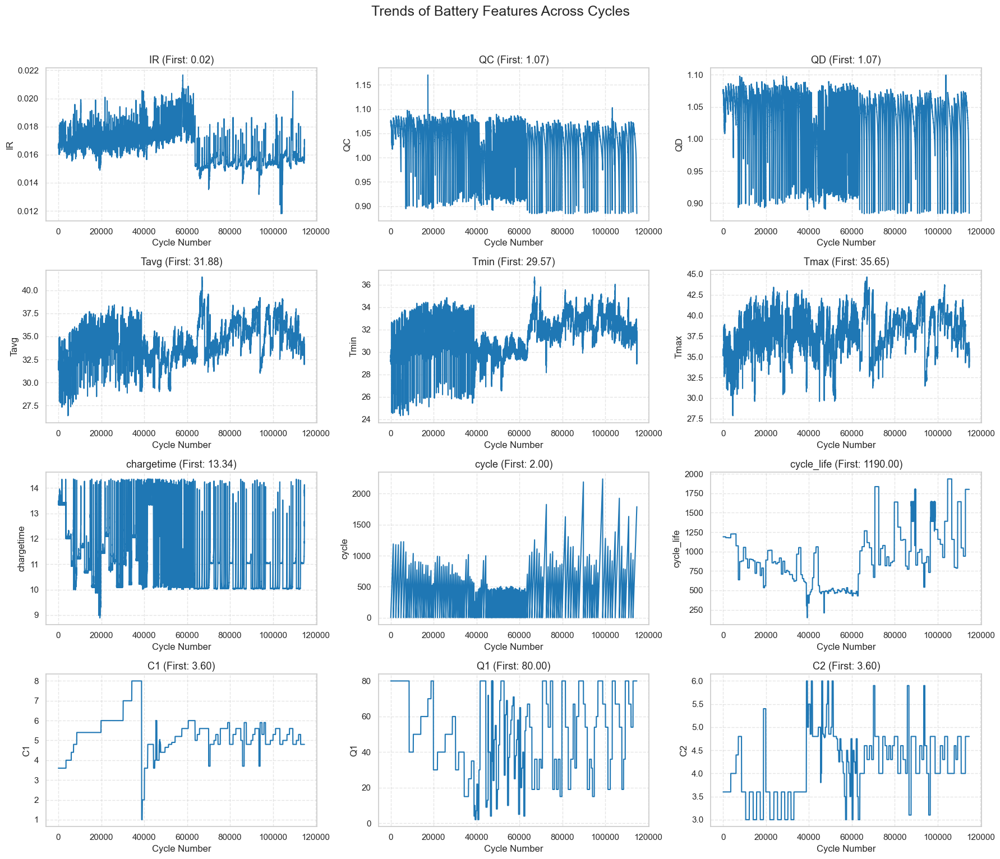

In [25]:
# Use df_clean or your dataframe
df = df_clean.copy()

# Automatically select numeric columns
numeric_cols = df.select_dtypes(include='number').columns.tolist()

if not numeric_cols:
    raise ValueError("No numeric columns found in the dataframe.")

# Determine grid size for plotting
n_columns = len(numeric_cols)
cols = 3
rows = math.ceil(n_columns / cols)

# Create subplots
fig = plt.figure(figsize=(18, 15))

for i, col in enumerate(numeric_cols):
    plt.subplot(rows, cols, i + 1)
    first_val = df[col].iloc[0]
    plt.plot(df[col], color='tab:blue')
    plt.title(f"{col} (First: {first_val:.2f})", fontsize=13)
    plt.xlabel("Cycle Number")
    plt.ylabel(col)
    plt.grid(True, linestyle='--', alpha=0.5)

# Add overall title
plt.suptitle("Trends of Battery Features Across Cycles", fontsize=18, y=1.02)
plt.tight_layout()
plt.show()


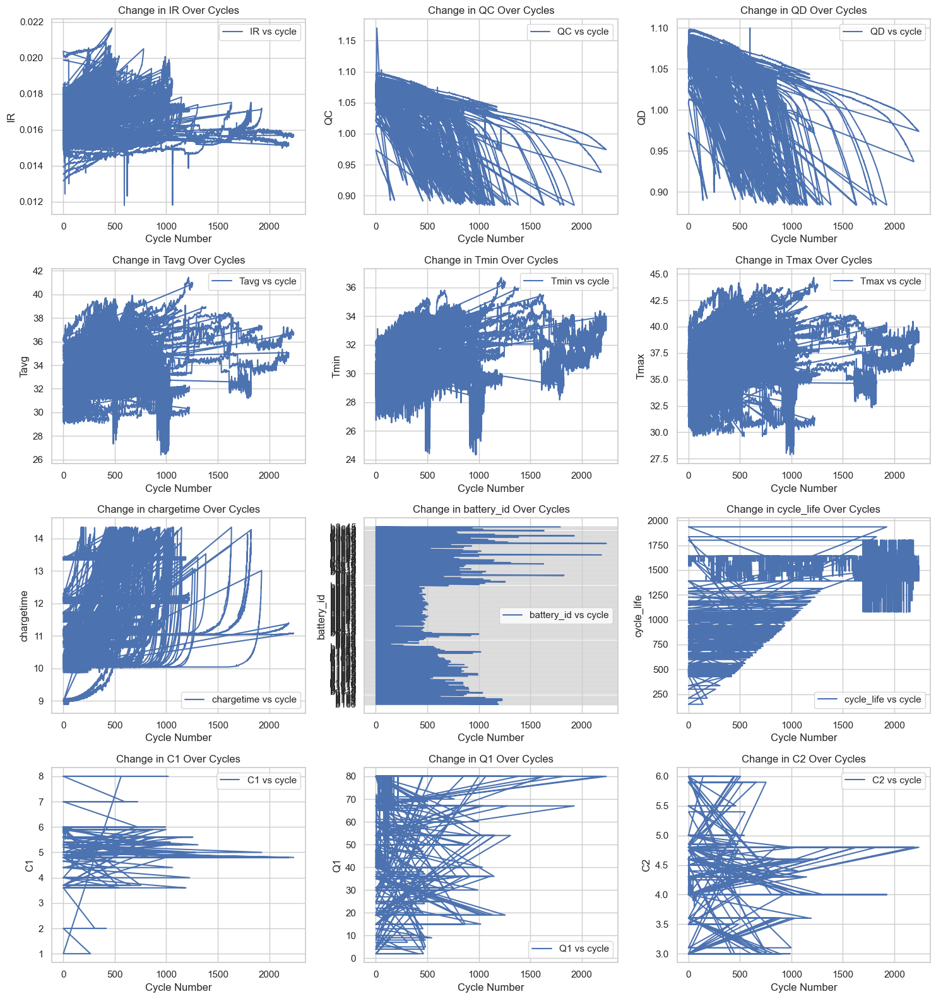

In [26]:
cols = [i for i in df.columns if i != 'cycle']
num_cols = len(cols)

# Setup: how many plots per row
plots_per_row = 3
rows = (num_cols + plots_per_row - 1) // plots_per_row  # Calculate total rows needed

plt.figure(figsize=(plots_per_row * 5, rows * 4))  # Adjust size as needed

for idx, col in enumerate(cols):
    plt.subplot(rows, plots_per_row, idx + 1)
    plt.plot(df['cycle'], df[col], label=f"{col} vs cycle")
    plt.xlabel('Cycle Number')
    plt.ylabel(col)
    plt.title(f"Change in {col} Over Cycles")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

In [27]:
df_clean.head()

,IR,QC,QD,Tavg,Tmin,Tmax,chargetime,cycle,battery_id,cycle_life,C1,Q1,C2
1,0.016742,1.071042,1.070689,31.875011,29.566130,35.652016,13.341250,2.0,b1c0,1190.0,3.6,80.0,3.6
2,0.016724,1.071674,1.071900,31.931490,29.604385,35.692978,13.425777,3.0,b1c0,1190.0,3.6,80.0,3.6
3,0.016681,1.072304,1.072510,31.932603,29.744202,35.680588,13.425167,4.0,b1c0,1190.0,3.6,80.0,3.6
4,0.016662,1.072970,1.073174,31.959322,29.644709,35.728691,13.341442,5.0,b1c0,1190.0,3.6,80.0,3.6
5,0.016623,1.073491,1.073576,31.961062,29.752932,35.711758,13.340835,6.0,b1c0,1190.0,3.6,80.0,3.6


In [28]:
row_data = df_clean.drop('battery_id', axis=1)
row_data.head()

,IR,QC,QD,Tavg,Tmin,Tmax,chargetime,cycle,cycle_life,C1,Q1,C2
1,0.016742,1.071042,1.070689,31.875011,29.566130,35.652016,13.341250,2.0,1190.0,3.6,80.0,3.6
2,0.016724,1.071674,1.071900,31.931490,29.604385,35.692978,13.425777,3.0,1190.0,3.6,80.0,3.6
3,0.016681,1.072304,1.072510,31.932603,29.744202,35.680588,13.425167,4.0,1190.0,3.6,80.0,3.6
4,0.016662,1.072970,1.073174,31.959322,29.644709,35.728691,13.341442,5.0,1190.0,3.6,80.0,3.6
5,0.016623,1.073491,1.073576,31.961062,29.752932,35.711758,13.340835,6.0,1190.0,3.6,80.0,3.6


In [29]:
corrmat = row_data.corr()
corrmat

,IR,QC,QD,Tavg,Tmin,Tmax,chargetime,cycle,cycle_life,C1,Q1,C2
IR,1.000000,-0.148061,-0.151074,-0.483648,-0.652485,-0.127836,0.407253,-0.127776,-0.499350,0.082348,-0.123205,-0.242659
QC,-0.148061,1.000000,0.999439,-0.235549,-0.199436,-0.193695,-0.355241,-0.608274,-0.052810,0.094342,-0.037108,-0.203887
QD,-0.151074,0.999439,1.000000,-0.234395,-0.197688,-0.193633,-0.355280,-0.606879,-0.050926,0.093077,-0.035726,-0.204060
Tavg,-0.483648,-0.235549,-0.234395,1.000000,0.901574,0.862681,-0.300016,0.314552,0.289792,0.179624,-0.164355,0.071143
Tmin,-0.652485,-0.199436,-0.197688,0.901574,1.000000,0.592374,-0.321602,0.373525,0.446868,0.107578,-0.045571,0.108383
Tmax,-0.127836,-0.193695,-0.193633,0.862681,0.592374,1.000000,-0.204211,0.151590,-0.027282,0.220265,-0.294080,-0.006251
chargetime,0.407253,-0.355241,-0.355280,-0.300016,-0.321602,-0.204211,1.000000,0.205814,0.116220,-0.130996,0.244359,-0.105386
cycle,-0.127776,-0.608274,-0.606879,0.314552,0.373525,0.151590,0.205814,1.000000,0.551166,-0.087920,0.282927,0.054227
cycle_life,-0.499350,-0.052810,-0.050926,0.289792,0.446868,-0.027282,0.116220,0.551166,1.000000,-0.133639,0.478900,0.047495
C1,0.082348,0.094342,0.093077,0.179624,0.107578,0.220265,-0.130996,-0.087920,-0.133639,1.000000,-0.327045,-0.524117


In [30]:
new_data_encoded = row_data.copy()
for col in row_data.select_dtypes(include=['object']).columns:
    new_data_encoded[col] = LabelEncoder().fit_transform(row_data[col])

corrma = new_data_encoded.corr()

<Axes: >

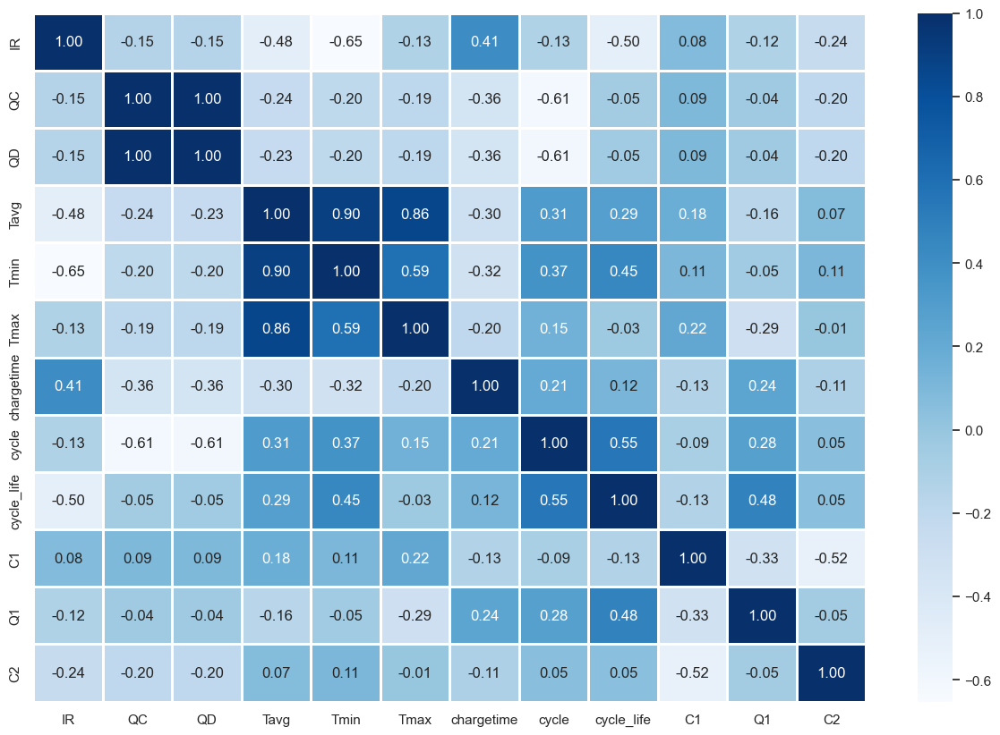

In [31]:
corrmat = row_data.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(
    corrmat,
    annot=True,
    cmap="Blues",
    fmt=".2f",
    linewidths=0.8,
    cbar=True

)

In [32]:
# Separating the target variable and features
target = row_data['cycle_life']
features = row_data.drop(['cycle_life'], axis=1)

# shapes of the target and features
target_shape, features_shape = target.shape, features.shape
target_shape, features_shape

((110678,), (110678, 11))

In [33]:
from sklearn.model_selection import (train_test_split, StratifiedKFold)

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=2301)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((88542, 11), (22136, 11), (88542,), (22136,))

In [34]:
# Example pipeline (scaler + model placeholder)
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Preprocessing step (scales features)
    ('model', None)  # Placeholder for model, will set later
])
pipeline.fit(X_train, y_train)

,steps,"[('scaler', ...), ('model', ...)]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True


In [40]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),             # Feature scaling
    ('model', RandomForestRegressor(          # Random Forest model
        n_estimators=200,
        max_depth=10,
        random_state=42
    ))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Random Forest Regression Results (using Pipeline)")
print(f"MSE  : {mse:.3f}")
print(f"RMSE : {rmse:.3f}")
print(f"R²   : {r2:.3f}")

Random Forest Regression Results (using Pipeline)
MSE  : 4554.930
RMSE : 67.490
R²   : 0.966


In [41]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),            # optional scaling
    ('model', DecisionTreeRegressor(
        max_depth=10,                        # control tree depth (tune this)
        random_state=42
    ))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("DecisionTreeRegressor Results (using Pipeline)")
print(f"MSE  : {mse:.3f}")
print(f"RMSE : {rmse:.3f}")
print(f"R²   : {r2:.3f}")

DecisionTreeRegressor Results (using Pipeline)
MSE  : 5809.059
RMSE : 76.217
R²   : 0.957


In [42]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),            # scaling is important for KNN
    ('model', KNeighborsRegressor(
        n_neighbors=5,                       # default K value (tune this)
        weights='distance',                  # or 'uniform'
        metric='minkowski'                   # distance metric
    ))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("K-Nearest Neighbors Regression Results (using Pipeline)")
print(f"MSE  : {mse:.3f}")
print(f"RMSE : {rmse:.3f}")
print(f"R²   : {r2:.3f}")

K-Nearest Neighbors Regression Results (using Pipeline)
MSE  : 271.087
RMSE : 16.465
R²   : 0.998


In [43]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),             # scaling helps sometimes
    ('model', XGBRegressor(
        n_estimators=300,                     # number of trees
        learning_rate=0.05,                   # step size shrinkage
        max_depth=6,                          # depth of trees
        subsample=0.8,                        # row sampling
        colsample_bytree=0.8,                 # feature sampling
        random_state=42,
        objective='reg:squarederror',         # for regression tasks
        n_jobs=-1                             # use all CPU cores
    ))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("XGBoost Regression Results (using Pipeline)")
print(f"MSE  : {mse:.3f}")
print(f"RMSE : {rmse:.3f}")
print(f"R²   : {r2:.3f}")

XGBoost Regression Results (using Pipeline)
MSE  : 1123.371
RMSE : 33.517
R²   : 0.992


In [44]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),             # optional, helps sometimes
    ('model', LGBMRegressor(
        n_estimators=300,                     # number of boosting rounds
        learning_rate=0.05,                   # step size
        max_depth=-1,                         # -1 means no limit
        num_leaves=31,                        # number of leaves
        subsample=0.8,                        # row sampling
        colsample_bytree=0.8,                 # feature sampling
        random_state=42,
        objective='regression'                # for regression task
    ))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("LightGBM Regression Results (using Pipeline)")
print(f"MSE  : {mse:.3f}")
print(f"RMSE : {rmse:.3f}")
print(f"R²   : {r2:.3f}")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2129
[LightGBM] [Info] Number of data points in the train set: 88542, number of used features: 11
[LightGBM] [Info] Start training from score 953.326116
LightGBM Regression Results (using Pipeline)
MSE  : 1199.115
RMSE : 34.628
R²   : 0.991


D:\LSTM+ ML\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning:

X does not have valid feature names, but LGBMRegressor was fitted with feature names

